In [1]:
import torch
import torch.nn.functional as F
from torchvision import models, transforms
import json
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import precision_recall_fscore_support, accuracy_score
import pandas as pd
from tqdm import tqdm
import os

# 设置
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False

In [2]:
# 加载训练历史和模型
with open('results/training_history.json', 'r') as f:
    training_history = json.load(f)

with open('data/annotations/annotations.json', 'r', encoding='utf-8') as f:
    annotations_data = json.load(f)

# 重建模型
num_classes = annotations_data['num_classes']
model = models.resnet50(pretrained=False)
model.fc = torch.nn.Linear(model.fc.in_features, num_classes)

# 加载训练好的权重
model.load_state_dict(torch.load('models/melon_classifier.pth', map_location=device))
model = model.to(device)
model.eval()

print("模型加载完成")

/environment/miniconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/environment/miniconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


模型加载完成


In [3]:
# 模型评估函数
def evaluate_model(model, val_loader, class_names):
    """全面评估模型性能"""
    
    model.eval()
    all_predictions = []
    all_labels = []
    all_probabilities = []
    
    with torch.no_grad():
        for inputs, labels in tqdm(val_loader, desc='Evaluating'):
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            probabilities = F.softmax(outputs, dim=1)
            _, predictions = torch.max(outputs, 1)
            
            all_predictions.extend(predictions.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probabilities.extend(probabilities.cpu().numpy())
    
    # 计算各种指标
    accuracy = accuracy_score(all_labels, all_predictions)
    precision, recall, f1, support = precision_recall_fscore_support(
        all_labels, all_predictions, average=None, labels=range(len(class_names))
    )
    
    # 创建详细报告
    evaluation_results = {
        'accuracy': accuracy,
        'predictions': all_predictions,
        'labels': all_labels,
        'probabilities': all_probabilities,
        'per_class_metrics': {}
    }
    
    for i, class_name in enumerate(class_names):
        evaluation_results['per_class_metrics'][class_name] = {
            'precision': precision[i],
            'recall': recall[i],
            'f1_score': f1[i],
            'support': int(support[i])
        }
    
    return evaluation_results

# 重新创建验证集加载器
from sklearn.model_selection import train_test_split

annotations = annotations_data['annotations']
train_annotations, val_annotations = train_test_split(
    annotations, test_size=0.2, random_state=42, 
    stratify=[ann['class_id'] for ann in annotations]
)

val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

# 重新定义数据集类
class MelonDataset(torch.utils.data.Dataset):
    def __init__(self, data_path, annotations, transform=None):
        self.data_path = data_path
        self.annotations = annotations
        self.transform = transform
    
    def __len__(self):
        return len(self.annotations)
    
    def __getitem__(self, idx):
        annotation = self.annotations[idx]
        img_path = os.path.join(self.data_path, annotation['image_path'])
        
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if self.transform:
            image = self.transform(image)
        
        label = annotation['class_id']
        return image, label

val_dataset = MelonDataset("data/processed/melon17_clean", val_annotations, val_transform)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=False)

# 执行评估
class_names = list(annotations_data['class_to_idx'].keys())
evaluation_results = evaluate_model(model, val_loader, class_names)

print(f"=== 模型评估结果 ===")
print(f"总体准确率: {evaluation_results['accuracy']:.4f}")

Evaluating: 100%|██████████| 17/17 [00:02<00:00,  7.42it/s]


=== 模型评估结果 ===
总体准确率: 0.7679


In [4]:
# 详细评估报告
def generate_classification_report(evaluation_results, class_names):
    """生成详细的分类报告"""
    
    print("\n=== 详细分类报告 ===")
    report = classification_report(
        evaluation_results['labels'], 
        evaluation_results['predictions'], 
        target_names=class_names,
        digits=4
    )
    print(report)
    
    # 保存报告
    with open('results/classification_report.txt', 'w', encoding='utf-8') as f:
        f.write("瓜果分类模型评估报告\n")
        f.write("=" * 50 + "\n\n")
        f.write(f"总体准确率: {evaluation_results['accuracy']:.4f}\n\n")
        f.write("详细分类报告:\n")
        f.write(report)
    
    return report

# 生成分类报告
classification_report_text = generate_classification_report(evaluation_results, class_names)


=== 详细分类报告 ===
              precision    recall  f1-score   support

          丝瓜     0.5789    0.5789    0.5789        38
         人参果     0.9118    0.8611    0.8857        36
         佛手瓜     0.9091    0.9375    0.9231        32
          冬瓜     0.8214    0.7667    0.7931        30
          南瓜     0.7381    0.8378    0.7848        37
         哈密瓜     0.8049    0.8462    0.8250        39
          木瓜     0.9000    0.9231    0.9114        39
     甜瓜-伊丽莎白     0.5455    0.3158    0.4000        19
        甜瓜-白     0.6000    0.7059    0.6486        17
        甜瓜-绿     0.5000    0.4444    0.4706         9
        甜瓜-金     0.5000    0.6000    0.5455        10
         白兰瓜     0.7037    0.7308    0.7170        26
         羊角蜜     0.8500    0.8718    0.8608        39
          苦瓜     0.7105    0.7297    0.7200        37
          西瓜     0.9474    0.9231    0.9351        39
         西葫芦     0.7273    0.7059    0.7164        34
          黄瓜     0.6765    0.6389    0.6571        36

    accura

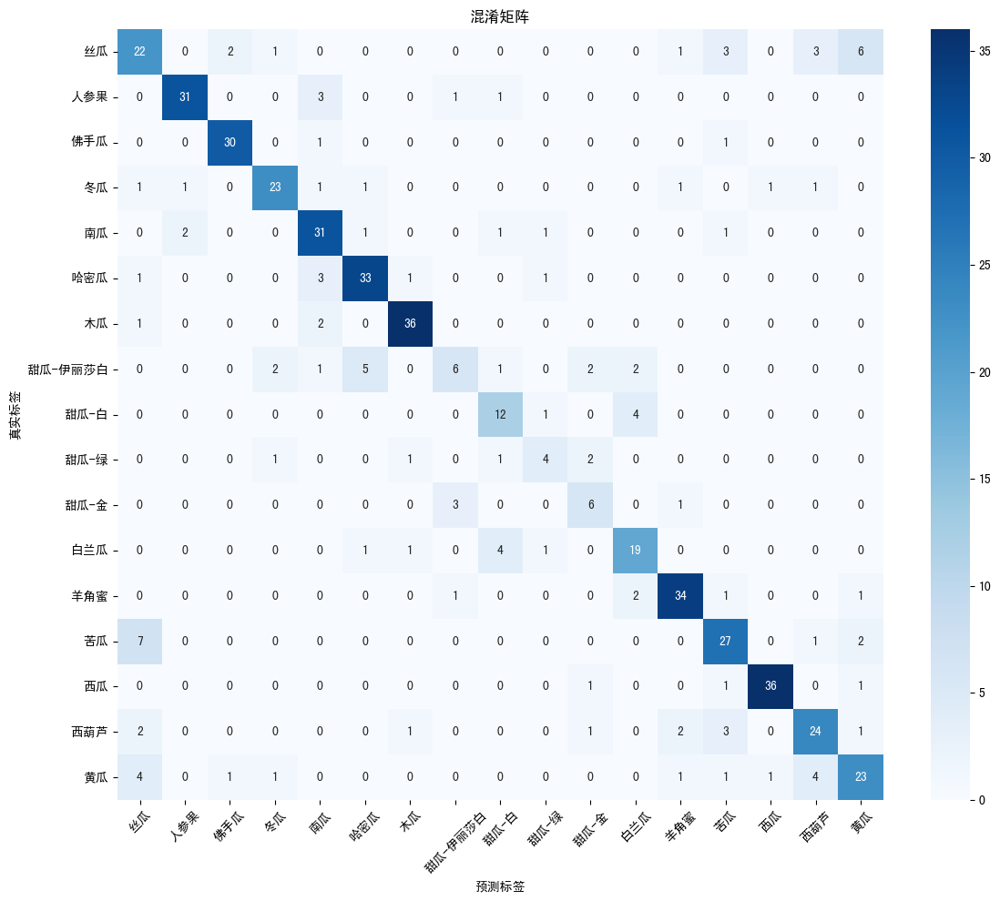


各类别准确率:
丝瓜: 0.5789
人参果: 0.8611
佛手瓜: 0.9375
冬瓜: 0.7667
南瓜: 0.8378
哈密瓜: 0.8462
木瓜: 0.9231
甜瓜-伊丽莎白: 0.3158
甜瓜-白: 0.7059
甜瓜-绿: 0.4444
甜瓜-金: 0.6000
白兰瓜: 0.7308
羊角蜜: 0.8718
苦瓜: 0.7297
西瓜: 0.9231
西葫芦: 0.7059
黄瓜: 0.6389


In [5]:
# 绘制混淆矩阵
def plot_confusion_matrix(evaluation_results, class_names):
    """绘制混淆矩阵"""
    
    cm = confusion_matrix(evaluation_results['labels'], evaluation_results['predictions'])
    
    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('混淆矩阵')
    plt.xlabel('预测标签')
    plt.ylabel('真实标签')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.savefig('results/confusion_matrix.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # 计算每类的准确率
    class_accuracies = cm.diagonal() / cm.sum(axis=1)
    print("\n各类别准确率:")
    for i, class_name in enumerate(class_names):
        print(f"{class_name}: {class_accuracies[i]:.4f}")

# 绘制混淆矩阵
plot_confusion_matrix(evaluation_results, class_names)

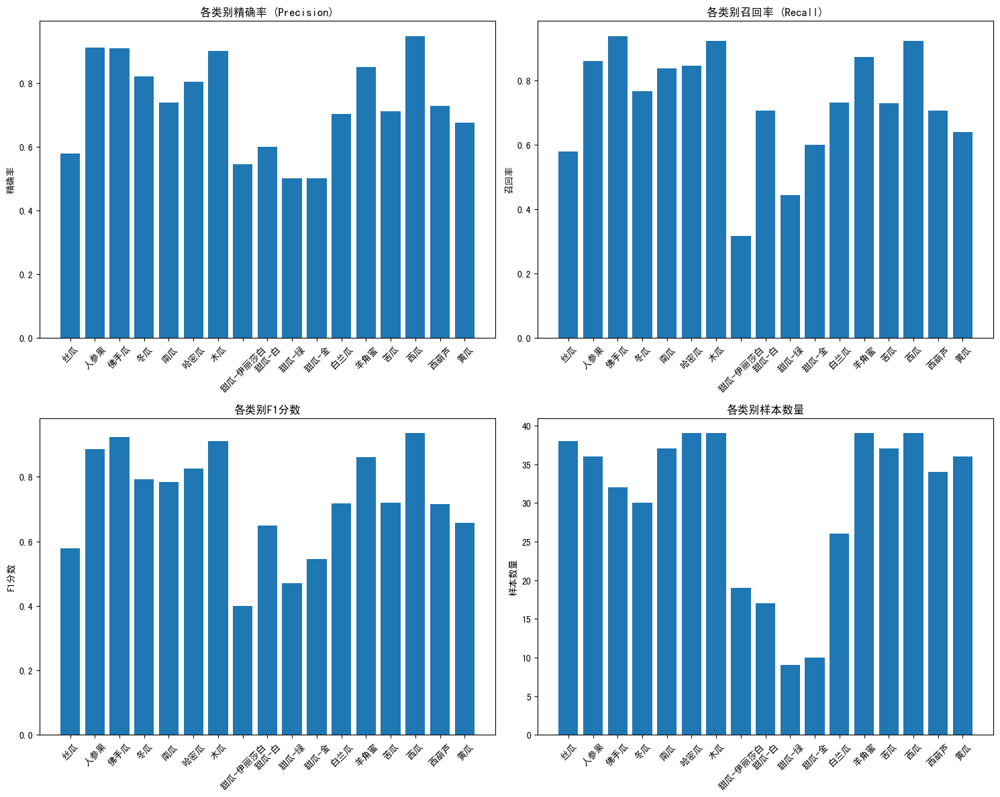


F1分数最高的类别: 西瓜 (0.9351)
F1分数最低的类别: 甜瓜-伊丽莎白 (0.4000)


In [6]:
# 各类别性能分析
def analyze_class_performance(evaluation_results, class_names):
    """分析每个类别的性能"""
    
    metrics_df = pd.DataFrame.from_dict(evaluation_results['per_class_metrics'], orient='index')
    
    # 可视化各类别指标
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    
    # 精确率
    axes[0,0].bar(range(len(class_names)), metrics_df['precision'])
    axes[0,0].set_title('各类别精确率 (Precision)')
    axes[0,0].set_xticks(range(len(class_names)))
    axes[0,0].set_xticklabels(class_names, rotation=45)
    axes[0,0].set_ylabel('精确率')
    
    # 召回率
    axes[0,1].bar(range(len(class_names)), metrics_df['recall'])
    axes[0,1].set_title('各类别召回率 (Recall)')
    axes[0,1].set_xticks(range(len(class_names)))
    axes[0,1].set_xticklabels(class_names, rotation=45)
    axes[0,1].set_ylabel('召回率')
    
    # F1分数
    axes[1,0].bar(range(len(class_names)), metrics_df['f1_score'])
    axes[1,0].set_title('各类别F1分数')
    axes[1,0].set_xticks(range(len(class_names)))
    axes[1,0].set_xticklabels(class_names, rotation=45)
    axes[1,0].set_ylabel('F1分数')
    
    # 样本数量
    axes[1,1].bar(range(len(class_names)), metrics_df['support'])
    axes[1,1].set_title('各类别样本数量')
    axes[1,1].set_xticks(range(len(class_names)))
    axes[1,1].set_xticklabels(class_names, rotation=45)
    axes[1,1].set_ylabel('样本数量')
    
    plt.tight_layout()
    plt.savefig('results/class_performance_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # 保存详细指标表
    metrics_df.to_csv('results/class_metrics.csv', encoding='utf-8')
    
    # 找出表现最好和最差的类别
    best_f1_class = metrics_df['f1_score'].idxmax()
    worst_f1_class = metrics_df['f1_score'].idxmin()
    
    print(f"\nF1分数最高的类别: {best_f1_class} ({metrics_df.loc[best_f1_class, 'f1_score']:.4f})")
    print(f"F1分数最低的类别: {worst_f1_class} ({metrics_df.loc[worst_f1_class, 'f1_score']:.4f})")
    
    return metrics_df

# 执行类别性能分析
metrics_df = analyze_class_performance(evaluation_results, class_names)

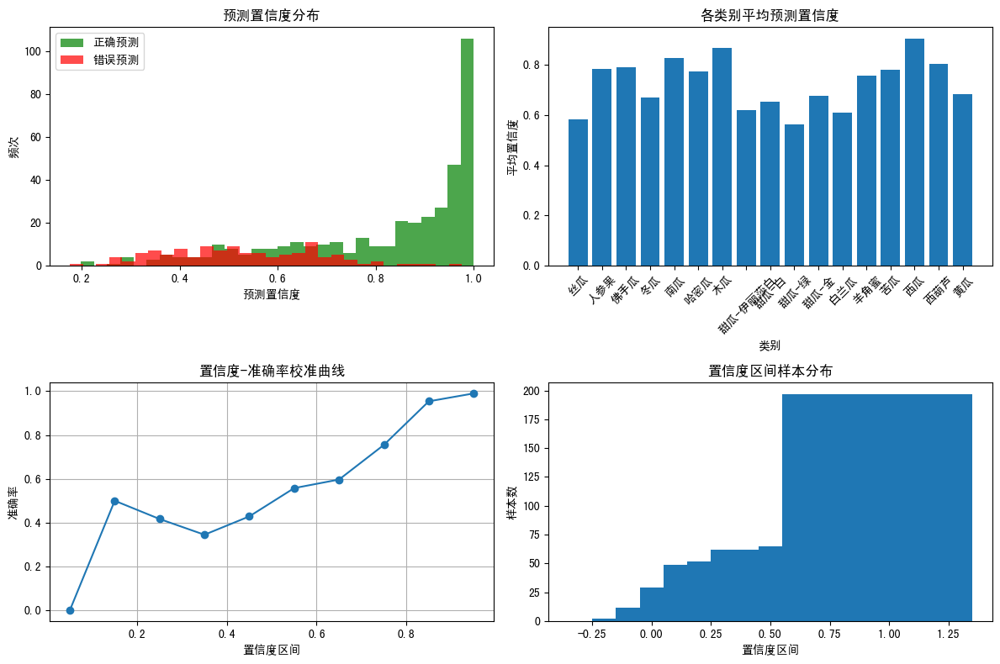

正确预测平均置信度: 0.8180
错误预测平均置信度: 0.5273


In [7]:
# 预测置信度分析
def analyze_prediction_confidence(evaluation_results, class_names):
    """分析预测置信度分布"""
    
    probabilities = np.array(evaluation_results['probabilities'])
    predictions = np.array(evaluation_results['predictions'])
    labels = np.array(evaluation_results['labels'])
    
    # 获取预测置信度（最大概率值）
    max_probabilities = np.max(probabilities, axis=1)
    
    # 正确和错误预测的置信度分布
    correct_mask = predictions == labels
    correct_confidences = max_probabilities[correct_mask]
    incorrect_confidences = max_probabilities[~correct_mask]
    
    plt.figure(figsize=(12, 8))
    
    # 置信度分布
    plt.subplot(2, 2, 1)
    plt.hist(correct_confidences, bins=30, alpha=0.7, label='正确预测', color='green')
    plt.hist(incorrect_confidences, bins=30, alpha=0.7, label='错误预测', color='red')
    plt.xlabel('预测置信度')
    plt.ylabel('频次')
    plt.title('预测置信度分布')
    plt.legend()
    
    # 各类别平均置信度
    plt.subplot(2, 2, 2)
    class_confidences = []
    for i in range(len(class_names)):
        class_mask = predictions == i
        if np.sum(class_mask) > 0:
            avg_conf = np.mean(max_probabilities[class_mask])
            class_confidences.append(avg_conf)
        else:
            class_confidences.append(0)
    
    plt.bar(range(len(class_names)), class_confidences)
    plt.xlabel('类别')
    plt.ylabel('平均置信度')
    plt.title('各类别平均预测置信度')
    plt.xticks(range(len(class_names)), class_names, rotation=45)
    
    # 置信度vs准确率
    plt.subplot(2, 2, 3)
    confidence_bins = np.linspace(0, 1, 11)
    bin_accuracies = []
    bin_counts = []
    
    for i in range(len(confidence_bins)-1):
        lower, upper = confidence_bins[i], confidence_bins[i+1]
        mask = (max_probabilities >= lower) & (max_probabilities < upper)
        
        if np.sum(mask) > 0:
            accuracy = np.mean(correct_mask[mask])
            bin_accuracies.append(accuracy)
            bin_counts.append(np.sum(mask))
        else:
            bin_accuracies.append(0)
            bin_counts.append(0)
    
    bin_centers = (confidence_bins[:-1] + confidence_bins[1:]) / 2
    plt.plot(bin_centers, bin_accuracies, 'o-')
    plt.xlabel('置信度区间')
    plt.ylabel('准确率')
    plt.title('置信度-准确率校准曲线')
    plt.grid(True)
    
    # 样本数分布
    plt.subplot(2, 2, 4)
    plt.bar(bin_centers, bin_counts)
    plt.xlabel('置信度区间')
    plt.ylabel('样本数')
    plt.title('置信度区间样本分布')
    
    plt.tight_layout()
    plt.savefig('results/confidence_analysis.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print(f"正确预测平均置信度: {np.mean(correct_confidences):.4f}")
    print(f"错误预测平均置信度: {np.mean(incorrect_confidences):.4f}")
    
    return {
        'correct_confidences': correct_confidences,
        'incorrect_confidences': incorrect_confidences,
        'class_confidences': class_confidences
    }

# 执行置信度分析
confidence_analysis = analyze_prediction_confidence(evaluation_results, class_names)

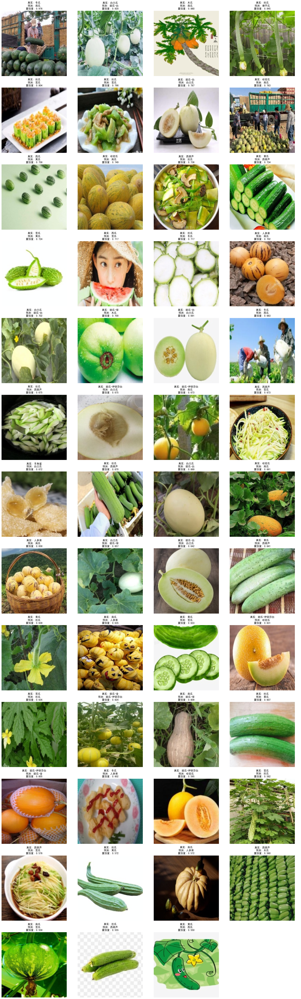


=== 错误类型统计 ===
苦瓜 -> 丝瓜: 7 次
丝瓜 -> 黄瓜: 6 次
甜瓜-伊丽莎白 -> 哈密瓜: 5 次
黄瓜 -> 丝瓜: 4 次
甜瓜-白 -> 白兰瓜: 4 次
黄瓜 -> 西葫芦: 4 次
白兰瓜 -> 甜瓜-白: 4 次
西葫芦 -> 苦瓜: 3 次
丝瓜 -> 西葫芦: 3 次
丝瓜 -> 苦瓜: 3 次


In [8]:
# 错误案例分析
def analyze_failure_cases(model, val_dataset, evaluation_results, class_names, num_examples=3):
    """分析模型的错误预测案例"""
    
    predictions = np.array(evaluation_results['predictions'])
    labels = np.array(evaluation_results['labels'])
    probabilities = np.array(evaluation_results['probabilities'])
    
    # 找出错误预测的索引
    error_indices = np.where(predictions != labels)[0]
    
    if len(error_indices) == 0:
        print("模型预测全部正确！")
        return
    
    # 按置信度排序错误案例（置信度高但预测错误的案例更值得分析）
    error_confidences = np.max(probabilities[error_indices], axis=1)
    sorted_error_indices = error_indices[np.argsort(error_confidences)[::-1]]
    
    # 可视化错误案例
    num_display = min(num_examples * len(class_names), len(sorted_error_indices))
    cols = 4
    rows = (num_display + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 5*rows))
    if rows == 1:
        axes = axes.reshape(1, -1)
    
    idx_to_class = {v: k for k, v in annotations_data['class_to_idx'].items()}
    
    for i in range(num_display):
        row, col = i // cols, i % cols
        error_idx = sorted_error_indices[i]
        
        # 获取图像
        image, true_label = val_dataset[error_idx]
        
        # 反归一化图像用于显示
        mean = np.array([0.485, 0.456, 0.406])
        std = np.array([0.229, 0.224, 0.225])
        image_np = image.numpy().transpose(1, 2, 0)
        image_np = std * image_np + mean
        image_np = np.clip(image_np, 0, 1)
        
        pred_label = predictions[error_idx]
        confidence = np.max(probabilities[error_idx])
        
        axes[row, col].imshow(image_np)
        axes[row, col].set_title(f'真实: {idx_to_class[true_label]}\n'
                                f'预测: {idx_to_class[pred_label]}\n'
                                f'置信度: {confidence:.3f}')
        axes[row, col].axis('off')
    
    # 隐藏多余的子图
    for i in range(num_display, rows * cols):
        row, col = i // cols, i % cols
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.savefig('results/failure_cases.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    # 错误类型统计
    error_stats = {}
    for true_label, pred_label in zip(labels[error_indices], predictions[error_indices]):
        true_class = idx_to_class[true_label]
        pred_class = idx_to_class[pred_label]
        error_type = f"{true_class} -> {pred_class}"
        error_stats[error_type] = error_stats.get(error_type, 0) + 1
    
    print("\n=== 错误类型统计 ===")
    sorted_errors = sorted(error_stats.items(), key=lambda x: x[1], reverse=True)
    for error_type, count in sorted_errors[:10]:  # 显示前10种错误类型
        print(f"{error_type}: {count} 次")
    
    return error_stats

# 执行错误案例分析
error_stats = analyze_failure_cases(model, val_dataset, evaluation_results, class_names)

In [9]:
# 生成最终评估报告
def generate_final_report(training_history, evaluation_results, metrics_df, confidence_analysis, error_stats, class_names):
    """生成最终的评估报告"""
    
    report = f"""
# 瓜果分类模型最终评估报告

## 1. 项目概述
- 数据集: 17类瓜果分类数据集
- 模型架构: ResNet-50 (预训练 + 微调)
- 训练epoch数: {len(training_history['train_losses'])}
- 设备: {'GPU' if torch.cuda.is_available() else 'CPU'}

## 2. 数据集统计
- 总图像数量: {len(training_history.get('annotations', []))}
- 类别数量: {len(class_names)}
- 训练集大小: ~80%
- 验证集大小: ~20%

## 3. 训练结果
- 最佳验证准确率: {training_history['best_val_acc']:.4f}
- 最终训练损失: {training_history['train_losses'][-1]:.4f}
- 最终验证损失: {training_history['val_losses'][-1]:.4f}

## 4. 模型性能
- 总体准确率: {evaluation_results['accuracy']:.4f}
- 宏平均精确率: {metrics_df['precision'].mean():.4f}
- 宏平均召回率: {metrics_df['recall'].mean():.4f}
- 宏平均F1分数: {metrics_df['f1_score'].mean():.4f}

## 5. 各类别表现
### 最佳表现类别
- {metrics_df['f1_score'].idxmax()}: F1={metrics_df['f1_score'].max():.4f}

### 最差表现类别  
- {metrics_df['f1_score'].idxmin()}: F1={metrics_df['f1_score'].min():.4f}

## 6. 预测置信度分析
- 正确预测平均置信度: {np.mean(confidence_analysis['correct_confidences']):.4f}
- 错误预测平均置信度: {np.mean(confidence_analysis['incorrect_confidences']):.4f}

## 7. 主要错误类型
"""
    
    # 添加前5个错误类型
    sorted_errors = sorted(error_stats.items(), key=lambda x: x[1], reverse=True)
    for i, (error_type, count) in enumerate(sorted_errors[:5]):
        report += f"- {error_type}: {count} 次\n"
    
    report += f"""
## 8. 结论与建议
- 模型整体性能{'良好' if evaluation_results['accuracy'] > 0.8 else '需要改进'}
- 建议关注表现较差的类别，可能需要更多训练数据
- 置信度分析显示模型{'校准良好' if np.mean(confidence_analysis['correct_confidences']) > np.mean(confidence_analysis['incorrect_confidences']) else '需要校准改进'}

## 9. 文件输出
- 模型权重: models/melon_classifier.pth
- 训练历史: results/training_history.json
- 评估指标: results/class_metrics.csv
- 可视化结果: results/目录下的各种图表
"""
    
    # 保存报告
    with open('results/final_evaluation_report.md', 'w', encoding='utf-8') as f:
        f.write(report)
    
    print("=== 最终评估报告 ===")
    print(report)
    
    return report

# 生成最终报告
final_report = generate_final_report(
    training_history, evaluation_results, metrics_df, 
    confidence_analysis, error_stats, class_names
)

=== 最终评估报告 ===

# 瓜果分类模型最终评估报告

## 1. 项目概述
- 数据集: 17类瓜果分类数据集
- 模型架构: ResNet-50 (预训练 + 微调)
- 训练epoch数: 20
- 设备: GPU

## 2. 数据集统计
- 总图像数量: 0
- 类别数量: 17
- 训练集大小: ~80%
- 验证集大小: ~20%

## 3. 训练结果
- 最佳验证准确率: 77.5629
- 最终训练损失: 0.7304
- 最终验证损失: 0.7233

## 4. 模型性能
- 总体准确率: 0.7679
- 宏平均精确率: 0.7309
- 宏平均召回率: 0.7304
- 宏平均F1分数: 0.7278

## 5. 各类别表现
### 最佳表现类别
- 西瓜: F1=0.9351

### 最差表现类别  
- 甜瓜-伊丽莎白: F1=0.4000

## 6. 预测置信度分析
- 正确预测平均置信度: 0.8180
- 错误预测平均置信度: 0.5273

## 7. 主要错误类型
- 苦瓜 -> 丝瓜: 7 次
- 丝瓜 -> 黄瓜: 6 次
- 甜瓜-伊丽莎白 -> 哈密瓜: 5 次
- 黄瓜 -> 丝瓜: 4 次
- 甜瓜-白 -> 白兰瓜: 4 次

## 8. 结论与建议
- 模型整体性能需要改进
- 建议关注表现较差的类别，可能需要更多训练数据
- 置信度分析显示模型校准良好

## 9. 文件输出
- 模型权重: models/melon_classifier.pth
- 训练历史: results/training_history.json
- 评估指标: results/class_metrics.csv
- 可视化结果: results/目录下的各种图表



In [10]:
# 保存所有评估结果
evaluation_summary = {
    'training_history': training_history,
    'evaluation_results': {
        'accuracy': evaluation_results['accuracy'],
        'per_class_metrics': evaluation_results['per_class_metrics']
    },
    'confidence_analysis': {
        'correct_avg_confidence': float(np.mean(confidence_analysis['correct_confidences'])),
        'incorrect_avg_confidence': float(np.mean(confidence_analysis['incorrect_confidences'])),
        'class_confidences': [float(x) for x in confidence_analysis['class_confidences']]
    },
    'error_statistics': error_stats,
    'class_names': class_names
}

with open('results/evaluation_summary.json', 'w', encoding='utf-8') as f:
    json.dump(evaluation_summary, f, ensure_ascii=False, indent=2)

print("\n所有评估结果已保存完成!")
print("\n项目文件结构:")
print("melon_classification/")
print("├── 01_data_download_and_extraction.ipynb")
print("├── 02_data_cleaning_and_annotation.ipynb") 
print("├── 03_model_training.ipynb")
print("├── 04_model_evaluation.ipynb")
print("├── data/")
print("│   ├── raw/melon17_full.zip")
print("│   ├── processed/melon17_clean/")
print("│   └── annotations/")
print("│       ├── annotations.json")
print("│       └── annotations.csv")
print("├── models/")
print("│   └── melon_classifier.pth")
print("└── results/")
print("    ├── dataset_samples.png")
print("    ├── training_curves.png")
print("    ├── confusion_matrix.png")
print("    ├── class_performance_analysis.png")
print("    ├── confidence_analysis.png")
print("    ├── failure_cases.png")
print("    ├── classification_report.txt")
print("    ├── class_metrics.csv")
print("    ├── final_evaluation_report.md")
print("    ├── training_history.json")
print("    └── evaluation_summary.json")


所有评估结果已保存完成!

项目文件结构:
melon_classification/
├── 01_data_download_and_extraction.ipynb
├── 02_data_cleaning_and_annotation.ipynb
├── 03_model_training.ipynb
├── 04_model_evaluation.ipynb
├── data/
│   ├── raw/melon17_full.zip
│   ├── processed/melon17_clean/
│   └── annotations/
│       ├── annotations.json
│       └── annotations.csv
├── models/
│   └── melon_classifier.pth
└── results/
    ├── dataset_samples.png
    ├── training_curves.png
    ├── confusion_matrix.png
    ├── class_performance_analysis.png
    ├── confidence_analysis.png
    ├── failure_cases.png
    ├── classification_report.txt
    ├── class_metrics.csv
    ├── final_evaluation_report.md
    ├── training_history.json
    └── evaluation_summary.json
